# Inspecting intertexts on a macro level

This code is based on https://github.com/mikekestemont/zwerfverzen/blob/main/notebooks/02-intertext-scale.ipynb

I exhaustively combined all of the works in the Antwerp School and kept in the ones that share larger parts.

1. <a href=#B5-E3>Brabantsche yeesten (B5) - Van den derden Eduwaert</a> and <a href=#E3-B5>vice versa</a>

2. <a href=#JT-BW>Jans teesteye - Boec vander wraken</a>

3. <a href=#kort-B1-3>Korte Kroniek van Brabant (Boendale) - Brabantsche yeesten (1-3)</a>

4. <a href=#B1-3-lang>Brabantsche yeesten (1-3) - Korte Kroniek van Brabant (Heraut van Beyeren)</a> and <a href=#lang-B1-3>vice versa</a>

5. <a href=#lang-kort>Korte kroniek van Brabant (Heraut van Beyeren) - Korte kroniek van Brabant (Boendale)</a>

6. <a href=#JT-LS>Jans teesteye - Der leken spieghel</a>

7. <a href=#M-DD>Melibeus - Dietsche doctrinale</a>

8. <a href=#S-LS>Sidrac - Der leken spieghel</a>

9. <a href=#S-DD>Sidrac - Dietsche doctrinale</a>

10. <a href=#S-JT>Sidrac - Jans teesteye</a>



## Loading in the needed libraries 

In [1]:
import glob
import os
from collections import Counter
from itertools import combinations, product

import numpy as np
np.random.seed(18012023)

import pandas as pd
pd.set_option('display.max_colwidth', 0)

import seaborn as sb

from sklearn.metrics import pairwise_distances
import lxml.etree
from scipy.spatial.distance import pdist, squareform
from tqdm import tqdm
from sklearn.feature_extraction.text import TfidfVectorizer

import matplotlib.pyplot as plt
import matplotlib
plt.rcParams['figure.dpi'] = 300
plt.rcParams['font.family'] = 'Arial'
from IPython.display import display
import plotly.express as px

## Loading in data and metadata

In [2]:
meta_df = pd.read_excel('../data/metadata_corrected.xlsx')
meta_df = meta_df[meta_df['exclude'] != 'x']
meta_df.sample(10)

,id,title,author,provenance,date_range,genre,subgenre,exclude
49,derde_martijn,Derde Martijn,Jacob van Maerlant,cdrom-mnl,1380-1425,Lyriek,NaN,NaN
206,sinte_kunera,Sinte Kunera,NaN,cdrom-mnl,1400-1500,Epiek,Heiligenleven,NaN
59,esopet,Esopet,Calfstaf en Noydekin,cdrom-mnl,1340-1360,Epiek,Dier,NaN
235,spiegel_historiael__4_velthem__fragm_we,Spiegel historiael (P4),Lodewijk van Velthem,cdrom-mnl,1393-1402,Epiek,Historiografie,NaN
48,der_ystorien_bloeme,Der ystorien bloeme,NaN,cdrom-mnl,1340-1360,Epiek,Historiografie,NaN
191,roman_van_caesar_fragm_br,Roman van Caesar,NaN,cdrom-mnl,1300-1350,Epiek,Ridder,NaN
247,truwanten,Truwanten,NaN,cdrom-mnl,1400-1420,Dramatiek,NaN,NaN
60,vanden_vier_vingheren_ende_vanden_dume,Expositie vanden viere vingheren ende vanden dume,NaN,cdrom-mnl,1400-1420,Epiek,Didactiek,NaN
70,Floyris ende Blantseflur,Floyris ende Blantseflur,NaN,CG1,1225-1201,Epiek,Ridder,NaN
65,florigout_fragm_l,Florigout,NaN,cdrom-mnl,1375-1400,Epiek,Ridder,NaN


In [3]:
def get_verse_groups(verses, size=2, intertexts=False):
    for i in range(len(verses) - (size - 1)):
        if not intertexts:
            yield ' / '.join(verses[i : i + size])
        else:
            its = Counter(verses[i : i + size])
            if None in its:
                yield None
            elif len(its) > 1:
                yield 'overlap'
            else:
                yield list(its.keys())[0]

In [4]:
def parse_xml(fn, rm_interpol=False, rm_prose=False):
    try:
        tree = lxml.etree.parse(fn)
    except OSError:
        print(f'- Could not load {fn}')
        return None
        
    if rm_interpol:
        for interpolation in tree.xpath("//interpolation"):
            interpolation.getparent().remove(interpolation)
       
    if rm_prose:
        for prose in tree.xpath("//prose"):
            prose.getparent().remove(prose)
        
    for line_node in tree.iterfind('.//l'):
        try:
            intertext_id = line_node.attrib['intertext']
        except KeyError:
            intertext_id = None
        
        tokens_ = line_node.attrib['tokens'].split()
        lemmas_ = []
        
        lemma_tags = [l.text if l.text is not None else '' for l in line_node.iterfind('.//lemma')] # changed this so that 'None' --> empty str
        pos_tags = [p.text if p.text is not None else '' for p in line_node.iterfind('.//pos')]
        
        for lemma, pos in zip(lemma_tags, pos_tags):
            for l, p in zip(lemma.split('+'), pos.split('+')):
                    if p == 'NOU-P':
                        lemmas_.append('NOU-P')
                    else:
                        lemmas_.append(l)
    
        yield tokens_, lemmas_, intertext_id

In [5]:
GROUP_SIZE = 2

titles, tokens, lemmas, intertexts = [], [], [], []

for title, group in tqdm(meta_df.groupby('title')):
    work_tokens, work_lemmas, work_intertexts = [], [], []
    
    for id_ in sorted(group['id']):
        for tok, lem, intertext_id in parse_xml(f'../data/xml_galahad_BY-split/{id_}.xml'):
            work_tokens.append(tok)
            work_lemmas.append(lem)
            work_intertexts.append(intertext_id)
    
    verse_tokens = [' '.join(v) for v in work_tokens]
    verse_lemmas = [' '.join(v) for v in work_lemmas]

    verse_group_tokens = list(get_verse_groups(verse_tokens, size=GROUP_SIZE))
    verse_group_lemmas = list(get_verse_groups(verse_lemmas, size=GROUP_SIZE))
    verse_group_intertexts = list(get_verse_groups(work_intertexts, size=GROUP_SIZE, intertexts=True))

    tokens.extend(verse_group_tokens)
    lemmas.extend(verse_group_lemmas)
    intertexts.extend(verse_group_intertexts)
    titles.extend([title] * len(verse_group_lemmas))

100%|█████████████████████████████████████████| 208/208 [00:10<00:00, 19.23it/s]


In [6]:
df = pd.DataFrame(zip(titles, tokens, lemmas, intertexts), columns=('title', 'tokens', 'lemmas', 'intertext'))
df = df[df['intertext'] != 'overlap']

In [7]:
df

,title,tokens,lemmas,intertext
0,AB recht ende averecht,Aensiet dese vrouwen hoe si gaen / Besiet hoe haer tuten staen,aanzien deze vrouw hoe zij gaan / bezien hoe haar tuut staan,None
1,AB recht ende averecht,Besiet hoe haer tuten staen / Claer dat si hen blanketten,bezien hoe haar tuut staan / klaar dat zij zij blanketten,None
2,AB recht ende averecht,Claer dat si hen blanketten / Die cleeder soe lanc dat si hen letten,klaar dat zij zij blanketten / die kleed zo lang dat zij zij letten,None
3,AB recht ende averecht,Die cleeder soe lanc dat si hen letten / Ende sleypen hen nae al op die eerde,die kleed zo lang dat zij zij letten / en slepen zij na al op die aarde,None
4,AB recht ende averecht,Ende sleypen hen nae al op die eerde / Fi diere vuylder hoverde,en slepen zij na al op die aarde / fi die vuil hovaart,None
...,...,...,...,...
874983,Wrake van Ragisel,Nu selewi swigen van desen / Ende van enen jongelinc vord lesen,nu zullen wij zwijgen van deze / en van een jongeling voort lezen,None
874984,Wrake van Ragisel,Ende van enen jongelinc vord lesen / Die te hove nu sal comen,en van een jongeling voort lezen / die te hof nu zullen komen,None
874985,Wrake van Ragisel,Die te hove nu sal comen / Eest alsict hebbe vernomen,die te hof nu zullen komen / zijn het als zij hebben vernemen,None
874986,Wrake van Ragisel,Eest alsict hebbe vernomen / Soe salmen noch van hem sien,zijn het als zij hebben vernemen / zo zullen men nog van hij zien,None


In [8]:
def add_rhyme_column(df):
    rhyme_words = []
    for lemmas in df['lemmas']:
        rhymes = []
        for verse in lemmas.split(' / '):
            words = verse.strip().split()
            if words:  # Check if the list is not empty
                rhymes.append(words[-1])
            else:
                rhymes.append('')  # Append an empty string if no words
        rhyme_words.append(' '.join(rhymes))
    df['rhyme'] = rhyme_words
    return df

df = add_rhyme_column(df)

In [9]:
optim_vs = 9000
optim_rw = 0.1693877551020408
optim_th = 0.4217159759743446

rolling_size = 1000

In [10]:
def tokenizer(text):
    return text.replace(' / ', ' ').lower().strip().split()

vec = TfidfVectorizer(max_features=optim_vs, min_df=2,
                      tokenizer=tokenizer, token_pattern=None).fit(df['lemmas'])

## Utility functions

In [11]:
def batch(iterable, n=1):
    l = iterable.shape[0]
    for ndx in range(0, l, n):
        yield iterable[ndx:min(ndx + n, l)]

def pairwise(title1, title2, rhyme_weight=.25, batch_size=5000):
    
    A = df[df['title'] == title1]
    B = df[df['title'] == title2]

    AX = vec.transform(A['lemmas']) + rhyme_weight * vec.transform(A['rhyme'])
    BX = vec.transform(B['lemmas']) + rhyme_weight * vec.transform(B['rhyme'])

    all_distances = None

    for ax in batch(AX, batch_size):
        if all_distances is None:
            all_distances = pairwise_distances(ax, BX, metric='cosine')
        else:
            all_distances = np.append(all_distances,
                                      pairwise_distances(ax, BX, metric='cosine'),
                                      axis=0)
    
    return all_distances

In [12]:
def plot_min_distance_nn(t1, t2, min_dists, threshold, rolling_size=1000):
    mu = min_dists.rolling(rolling_size).mean()
    fig, ax = plt.subplots()
    mu.plot(ax=ax, color='darkblue') # poster: '#c22837')
    ax.axhline(threshold, ls='--', c='grey')
    ax.set_ylim(0, 1)
    ax.set_xlabel(t1)
    ax.set_ylabel('Distance to NN in ' + t2)
    return ax

In [13]:
def plot_intertexts(t1, t2, distances, threshold):
    x, y, sizes = [], [], []
    min_raw_sim, max_raw_sim = float('inf'), float('-inf')

    for i, dist in enumerate(distances):
        min_dist = dist.min()  # Get the minimum distance from this row
        if min_dist < threshold:
            # Calculate raw similarity
            raw_similarity = 1 - min_dist
            
            # Scaling for visualization
            scaled_similarity = raw_similarity ** 3  
            scaled_size = max(scaled_similarity * 200, 10)  # Avoid zero-size dots
            
            x.append(i)
            y.append(np.argmin(dist))  # Index of the minimum distance
            sizes.append(scaled_size)  # Adjust size
            
            # Track raw similarity for legend
            min_raw_sim = min(min_raw_sim, raw_similarity)
            max_raw_sim = max(max_raw_sim, raw_similarity)

    plt.figure(figsize=(10, 7))
    ax = plt.gca()  # Get the current axis
    scatter = plt.scatter(x, y, s=sizes, alpha=0.2, edgecolors='w', color='darkblue')

    # Create a legend for min and max raw similarity
    legend_handles = [
        plt.scatter([], [], s=max(min_raw_sim ** 3 * 200, 10), alpha=0.5, edgecolors='w', label=f'Min similarity: {min_raw_sim:.2f}', color='darkblue'),
        plt.scatter([], [], s=max(max_raw_sim ** 3 * 200, 10), alpha=0.5, edgecolors='w', label=f'Max similarity: {max_raw_sim:.2f}', color='darkblue')
    ]
    plt.legend(handles=legend_handles, title='Similarity', loc='lower right')
    
    # Adjust frame and ticks for better contrast
    ax.spines['top'].set_color('black')
    ax.spines['right'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_color('black')

    plt.xlabel(t1)
    plt.ylabel(t2)
    plt.title(f'Intertexts between {t1} and {t2}')
    plt.show()

In [14]:
def plot_intertexts_colour(t1, t2, distances, threshold):
    x, y, sizes = [], [], []
    min_raw_sim, max_raw_sim = float('inf'), float('-inf')

    for i, dist in enumerate(distances):
        min_dist = dist.min()  # Get the minimum distance from this row
        if min_dist < threshold:
            # Calculate raw similarity
            raw_similarity = 1 - min_dist
            
            # Aggressive scaling for visualization
            scaled_similarity = raw_similarity ** 3  
            scaled_size = max(scaled_similarity * 200, 10)  # Avoid zero-size dots
            
            x.append(i)
            y.append(np.argmin(dist))  # Index of the minimum distance
            sizes.append(scaled_size)  # Adjust size
            
            # Track raw similarity for legend
            min_raw_sim = min(min_raw_sim, raw_similarity)
            max_raw_sim = max(max_raw_sim, raw_similarity)

    plt.figure(figsize=(10, 7), facecolor='#feecd1')
    ax = plt.gca()  # Get the current axis
    ax.set_facecolor('#fff4dc')
    scatter = plt.scatter(x, y, s=sizes, alpha=0.2, edgecolors='w', color='darkblue')

    # Create a custom legend for min and max raw similarity
    # Create a custom legend for min and max raw similarity
    legend_handles = [
        plt.scatter([], [], s=max(min_raw_sim ** 3 * 200, 10), color='darkblue', alpha=0.5, edgecolors='w', label=f'Min similarity: {min_raw_sim:.2f}'),
        plt.scatter([], [], s=max(max_raw_sim ** 3 * 200, 10), color='darkblue', alpha=0.5, edgecolors='w', label=f'Max similarity: {max_raw_sim:.2f}')
    ]
    plt.legend(handles=legend_handles, title='Similarity', loc='lower right')
    
    # Adjust frame and ticks for better contrast
    ax.spines['top'].set_color('black')
    ax.spines['right'].set_color('black')
    ax.spines['bottom'].set_color('black')
    ax.spines['left'].set_color('black')

    plt.xlabel(t1)
    plt.ylabel(t2)
    plt.title(f'Intertexts between {t1} and {t2}', fontsize=16)
    plt.show()

In [15]:
def plot_intertexts_interactable(t1, t2, distances, threshold):
    x, y, sizes, hover_texts = [], [], [], []

    for i, dist in enumerate(distances):
        min_dist = dist.min()
        if min_dist < threshold:
            raw_similarity = 1 - min_dist
            scaled_similarity = raw_similarity ** 3
            scaled_size = max(scaled_similarity * 30, 1)
            
            verse1_num = i            # x-axis verse number
            verse2_num = np.argmin(dist)  # y-axis verse number
            
            verse1_tokens = df.loc[(df['title'] == t1)].iloc[verse1_num]['tokens']
            verse2_tokens = df.loc[(df['title'] == t2)].iloc[verse2_num]['tokens']
            
            hover_text = (
                f"{t1}: {verse1_tokens} (vs. {verse1_num}–{verse1_num+1})<br>"
                f"{t2}: {verse2_tokens} (vs. {verse2_num}–{verse2_num+1})"
            )
            
            x.append(verse1_num)
            y.append(verse2_num)
            sizes.append(scaled_size)
            hover_texts.append(hover_text)

    plot_df = pd.DataFrame({'x': x, 'y': y, 'size': sizes, 'verse_pair': hover_texts})

    fig = px.scatter(
        plot_df,
        x='x', y='y',
        size='size', size_max=12,
        opacity=0.4, color_discrete_sequence=['darkblue'],
        labels={'x': t1, 'y': t2},
        title=f'Intertexts between {t1} and {t2}'
    )

    fig.update_traces(
        marker=dict(line=dict(width=1, color='white')),
        hovertemplate='<b>Verse Pair:</b><br>%{customdata}<extra></extra>',
        customdata=plot_df['verse_pair']
    )

    fig.update_layout(
        width=850,
        height=600
    )
    
    # Export as HTML file
    # Export as HTML file to figures/html/
    filename = f"{t1}-{t2}.html".replace(" ", "_")
    output_path = f"../figures/html/{filename}"
    fig.write_html(output_path)

    fig.show()

In [16]:
def get_interpolations(title):
    fn = meta_df[meta_df['title'] == title]['id'].iloc[0]
    tree = lxml.etree.parse(f'../data/xml_galahad_BY-split/{fn}.xml').getroot()
    interpol_idxs, interpol_names, line_cnt = [], [], 0
    for element in tree:
        line_cnt += 1
        if element.tag == 'interpolation':
            idxs, length = line_cnt, len(element.findall('l'))
            interpol_idxs.append([line_cnt, line_cnt + length])
            line_cnt += length
            interpol_names.append(element.attrib['reason'])      
    return interpol_idxs, interpol_names

## Case studies

### 1. Brabantsche yeesten (B5) and Van den derden Eduwaert <a name='B5-E3'/>

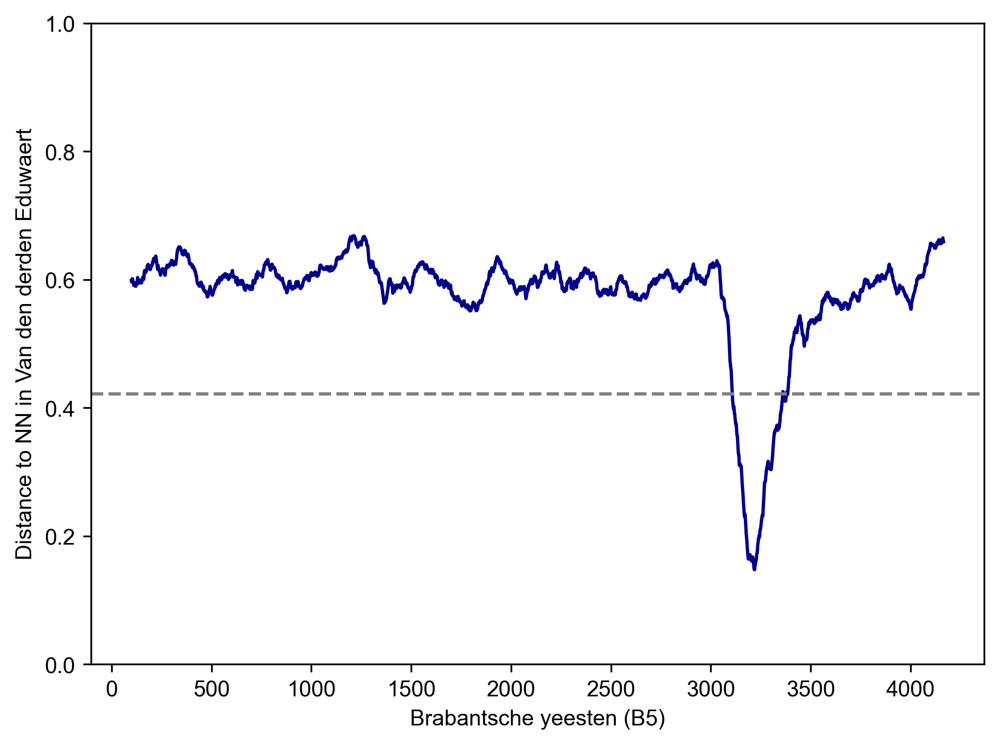

In [17]:
t1, t2 = 'Brabantsche yeesten (B5)', 'Van den derden Eduwaert'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=100)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

Cosine distance for every verse pair to their neigherst neighbour. The drop points at an intertextual passage.

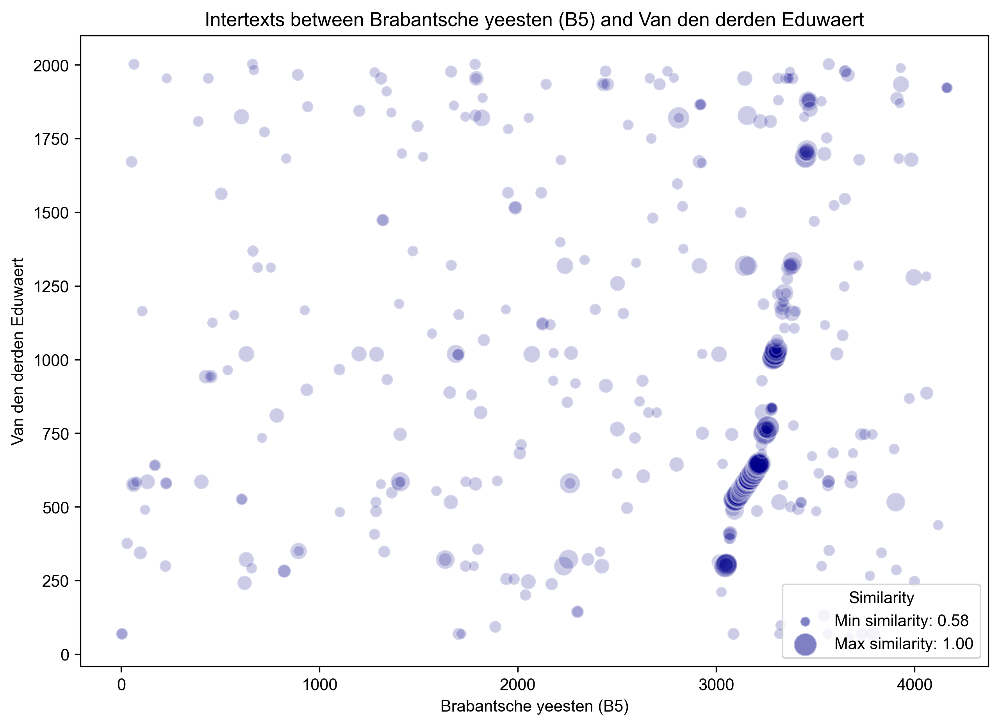

In [18]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

All the dots are neigherst neighbours verse pairs that are above the optim_th. The verse NN pairs below optim_th are not included. The bigger the dot, the larger the cosine similarity between the verse pairs. You can see some scattering, this can point at 
1) Coincidental intertexts (maybe because the texts share the same author?)
2) Mismatches by our calculation

The interesting dots are the 'trains', there you can see that certain passages include many identical, shared versions between the text, after one another: a shared passage.

In [19]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

Same plot as before but after running the cell you can hover over the dots and see the parallel verses.

### Vice versa <a name='E3-B5'/>

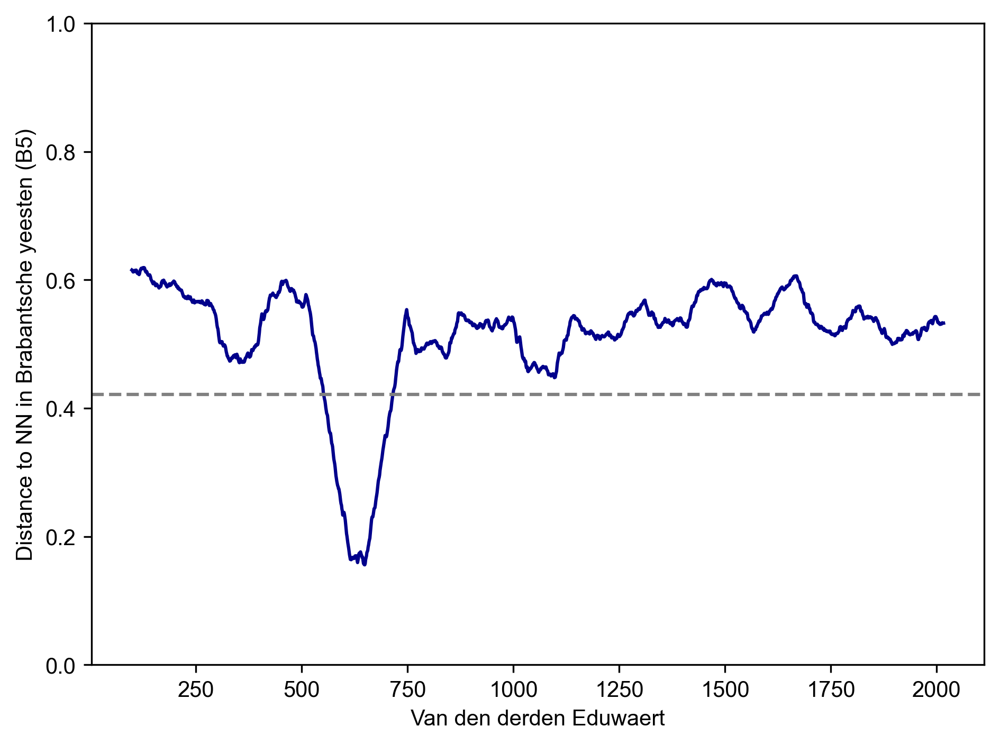

In [20]:
t1, t2 = 'Van den derden Eduwaert', 'Brabantsche yeesten (B5)'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=100)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

In [21]:
get_interpolations('Van den derden Eduwaert') # this part is marked as an interpolation

([[517, 761]], ['BY5'])

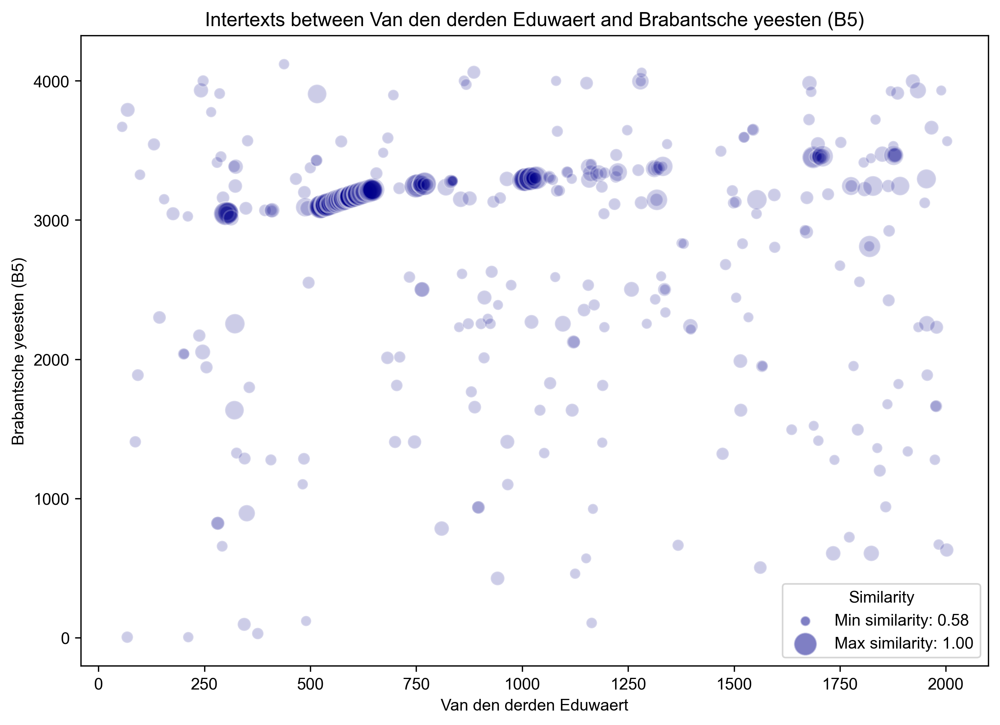

In [22]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [23]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### 2. Jans teesteye and Boec vander wraken <a name='JT-BW'/>

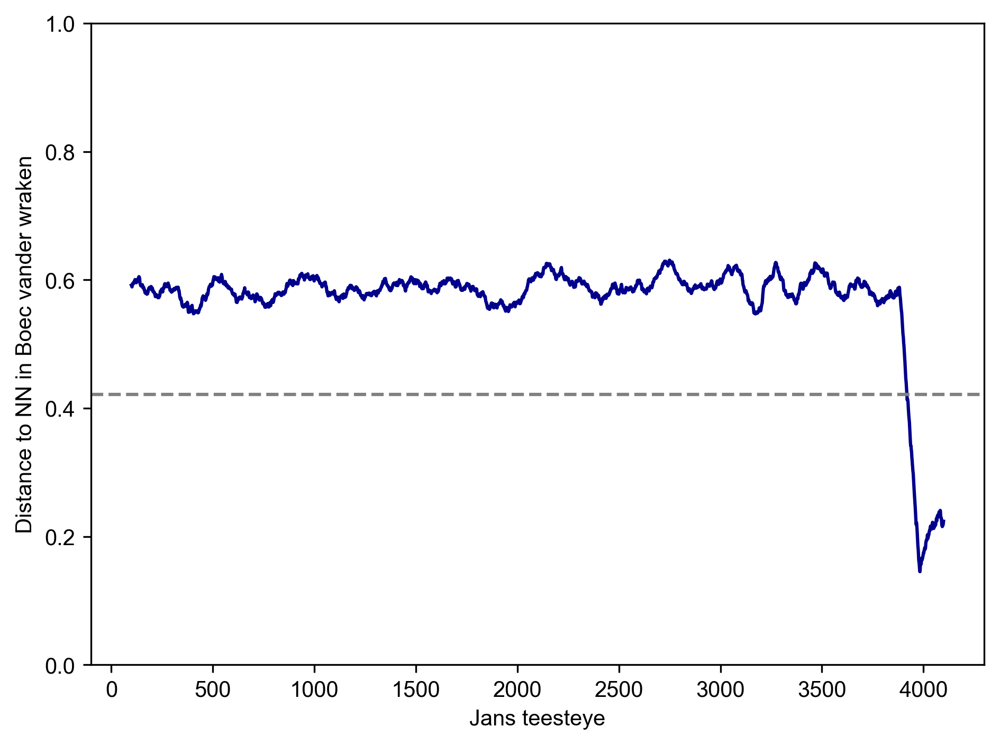

In [24]:
t1, t2 = 'Jans teesteye', 'Boec vander wraken'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=100)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

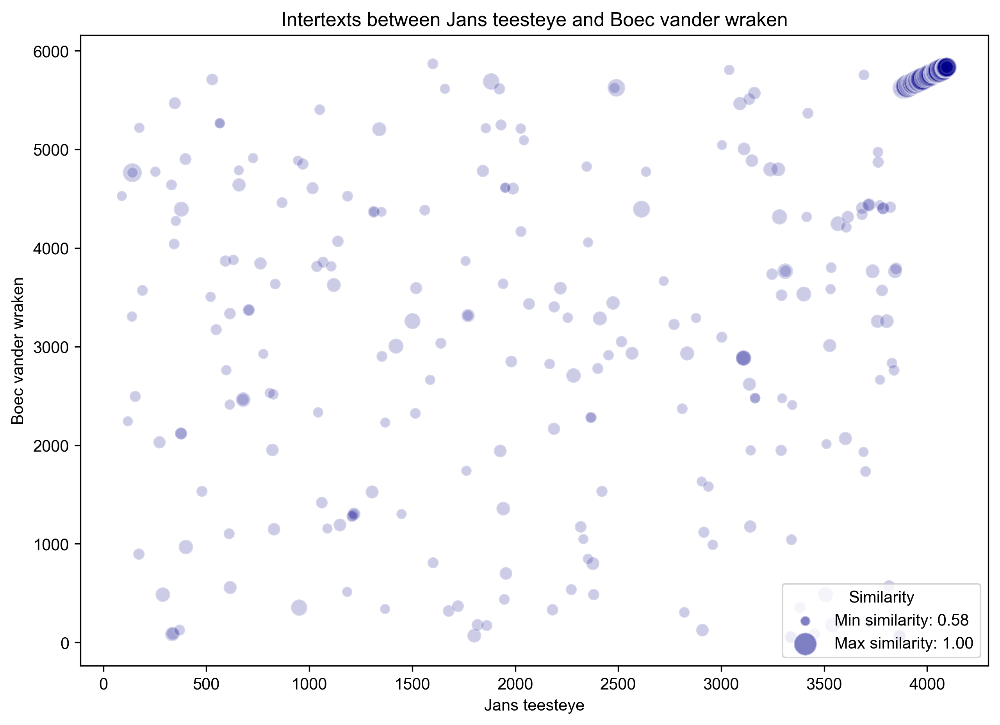

In [25]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [26]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### 3. Korte Kroniek van Brabant (Boendale) - Brabantsche yeesten (1-3) <a name='kort-B1-3'/>


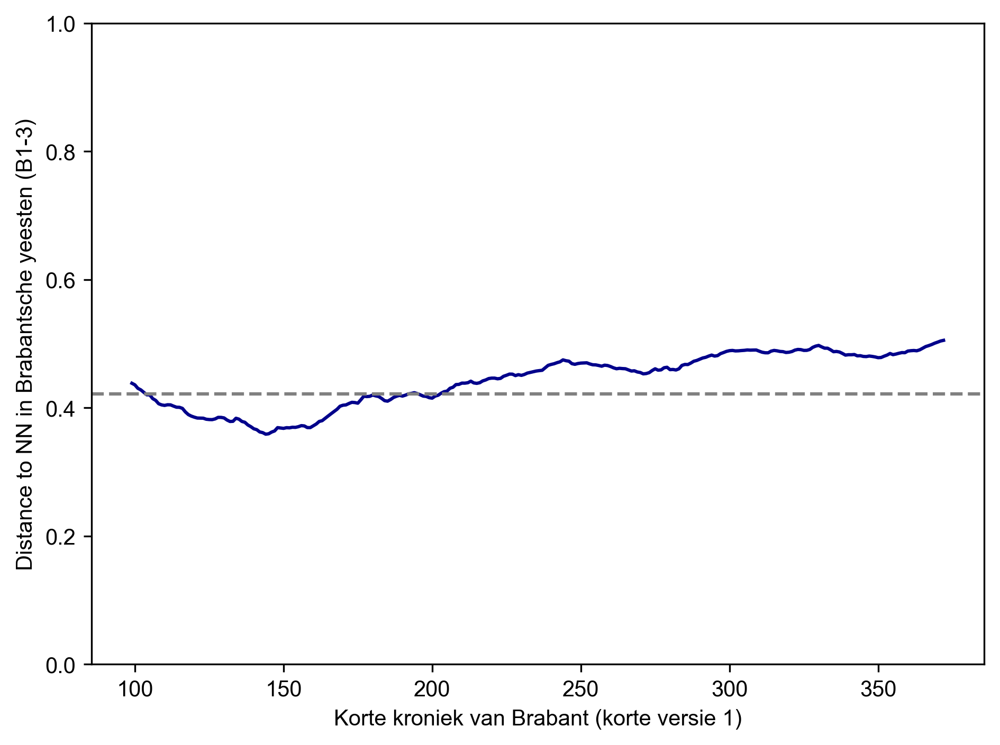

In [27]:
t1, t2 = 'Korte kroniek van Brabant (korte versie 1)', 'Brabantsche yeesten (B1-3)'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=100)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

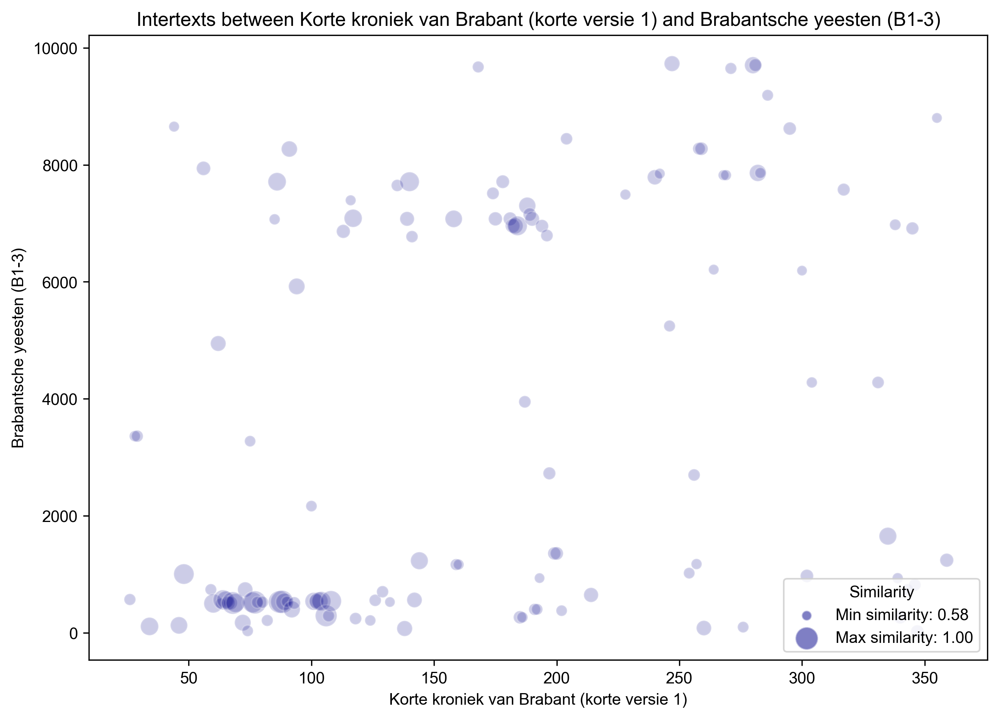

In [28]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [29]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### 4. Brabantsche yeesten (B1-3) and Korte Kroniek van Brabant (Heraut van Beyeren) <a name='B1-3-lang'/>

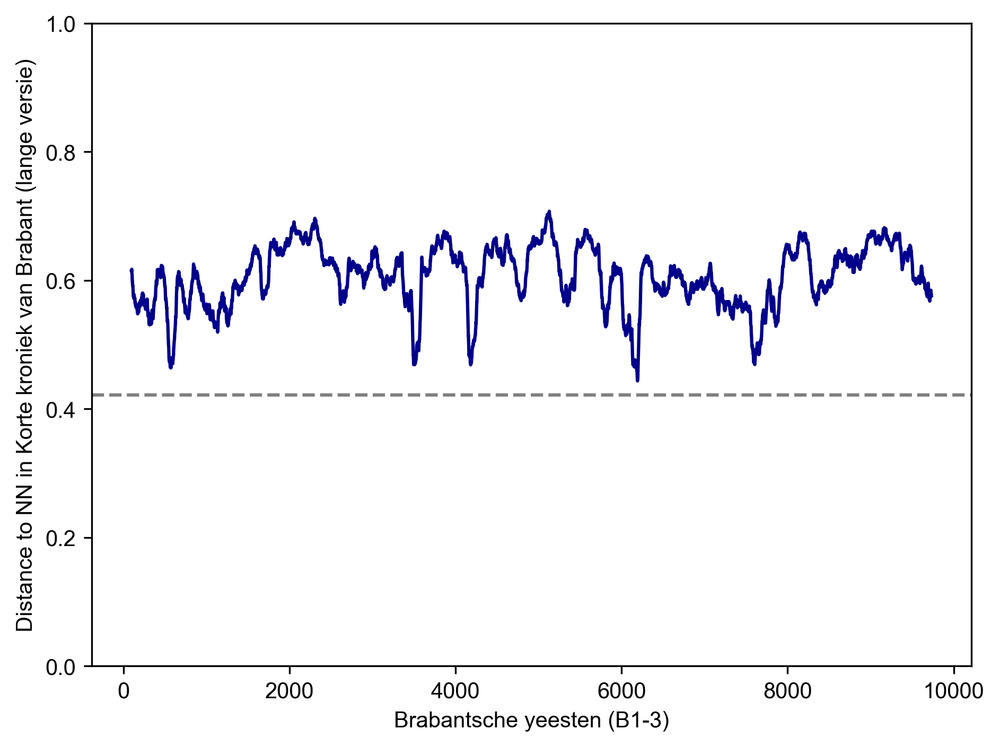

In [30]:
t1, t2 = 'Brabantsche yeesten (B1-3)', 'Korte kroniek van Brabant (lange versie)'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=100)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

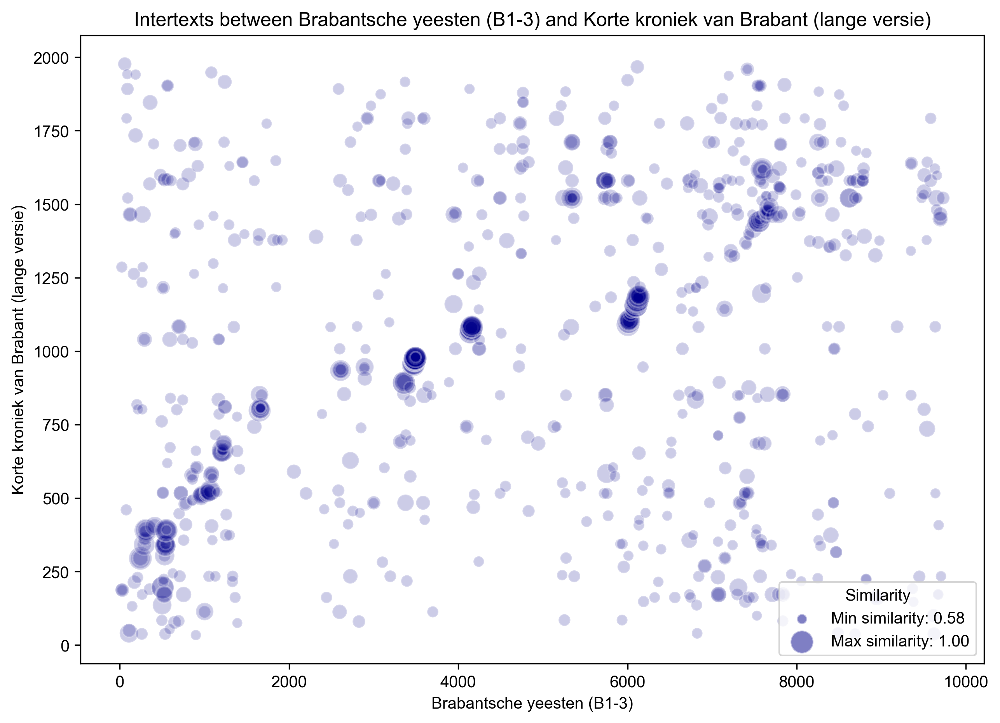

In [31]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [32]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### Vice versa <a name='lang-B1-3'/>

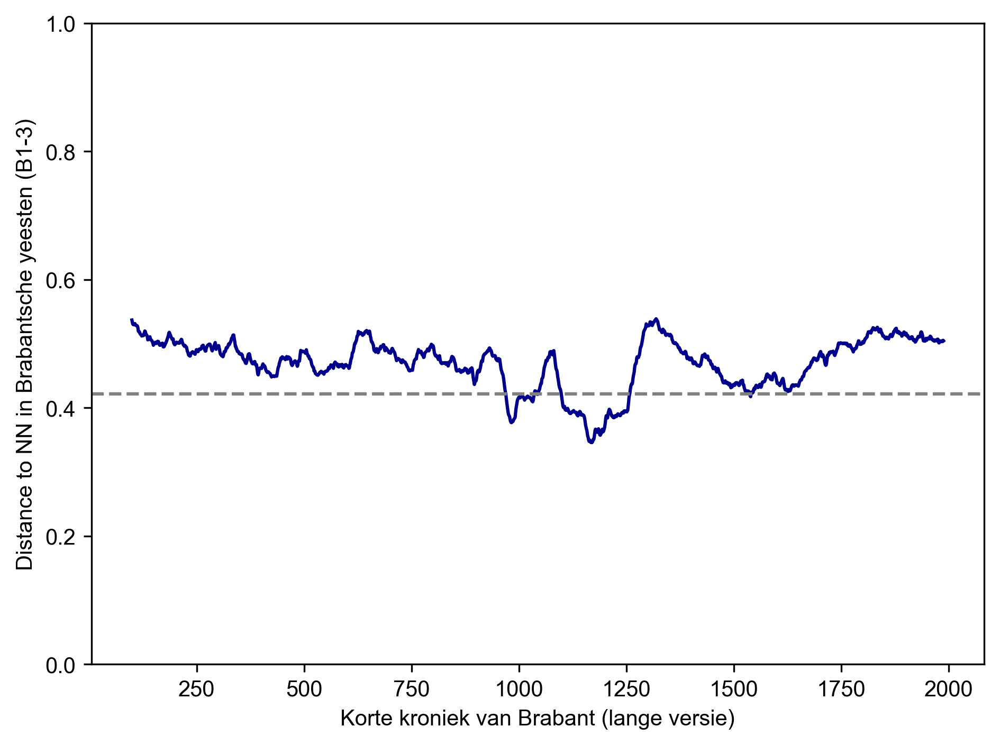

In [33]:
t1, t2 = 'Korte kroniek van Brabant (lange versie)', 'Brabantsche yeesten (B1-3)'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=100)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

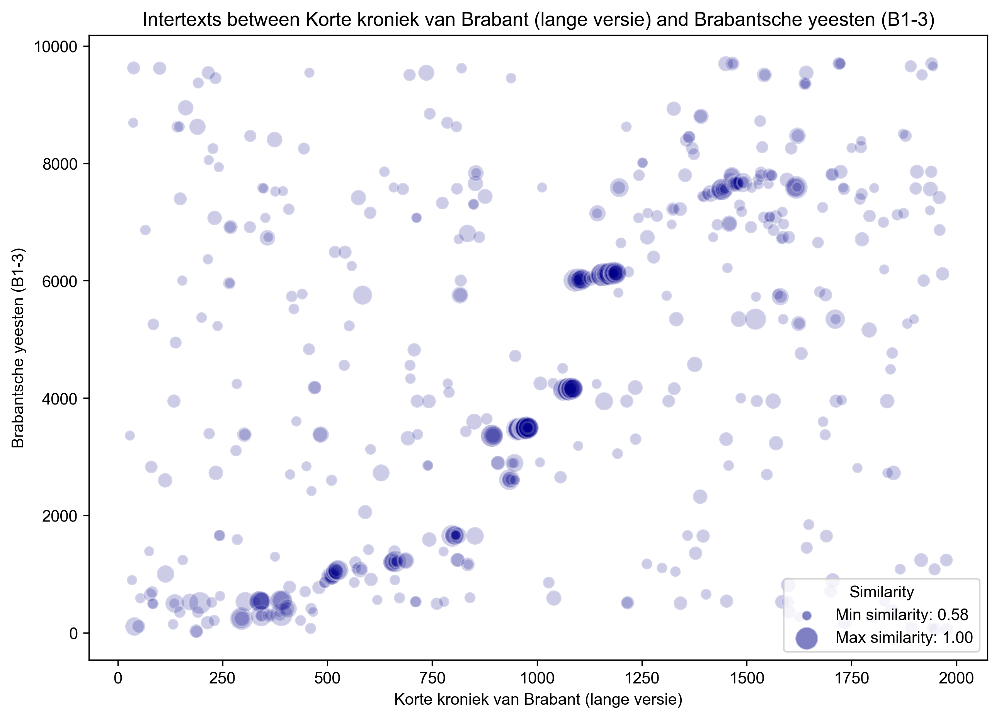

In [34]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [35]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### 5. Korte kroniek van Brabant (Heraut van Beyeren) - Korte Kroniek van Brabant (Boendale) <a name='lang-kort'/>

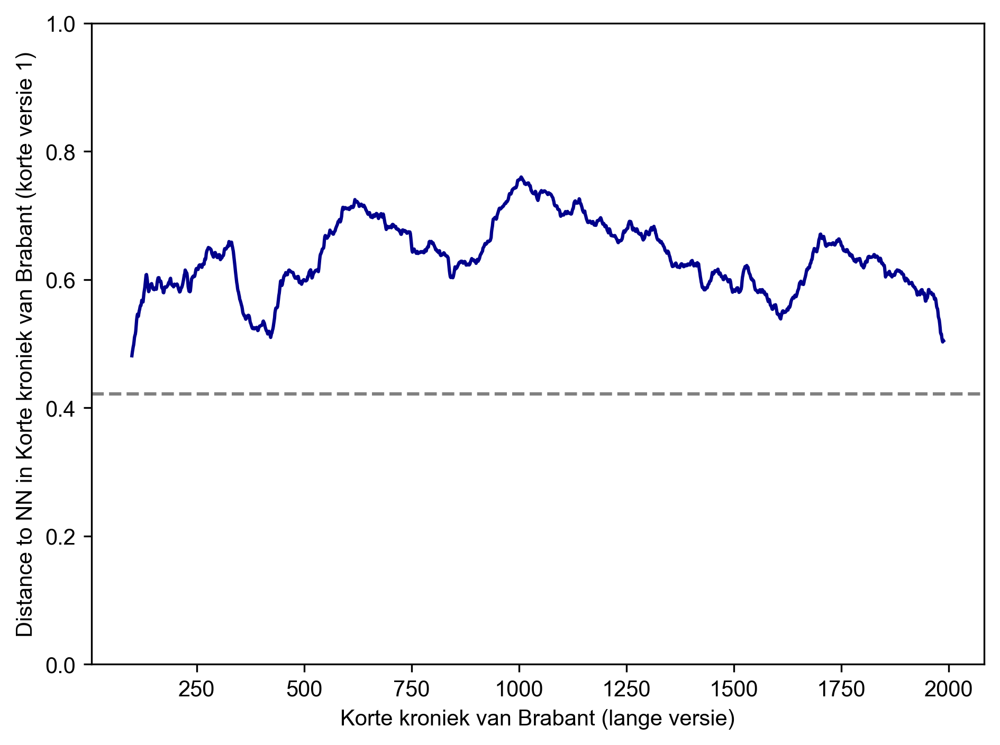

In [36]:
t1, t2 = 'Korte kroniek van Brabant (lange versie)', 'Korte kroniek van Brabant (korte versie 1)'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=100)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

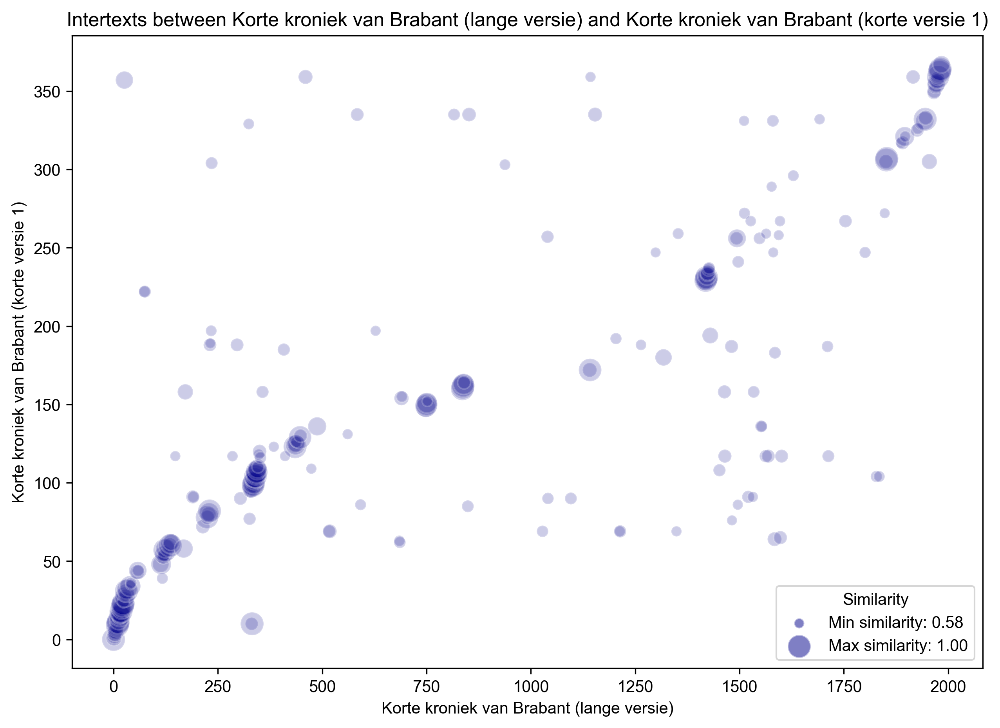

In [37]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [38]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### 6. Jans teesteye and Der leken spieghel <a name='JT-LS'/>

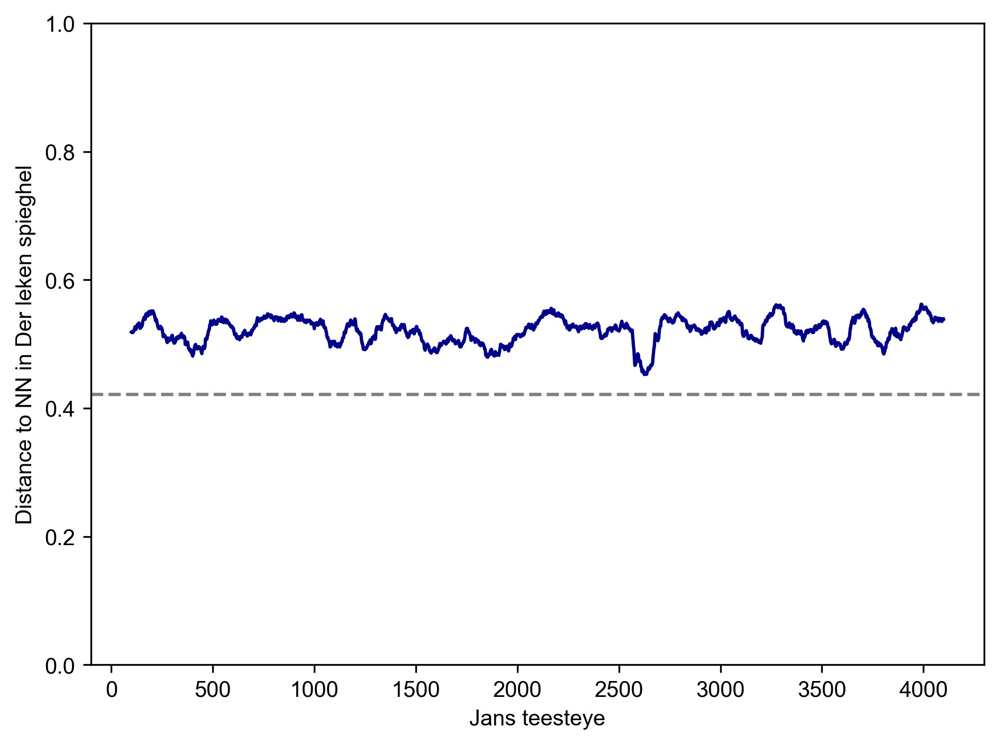

In [39]:
t1, t2 = 'Jans teesteye', 'Der leken spieghel'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=100)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

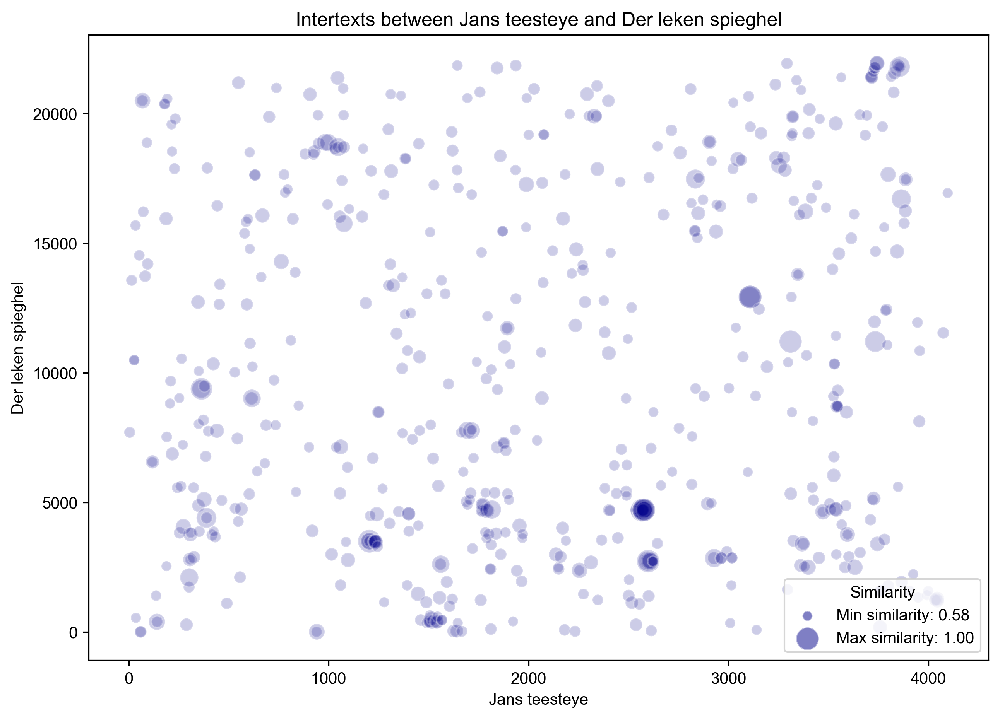

In [40]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [41]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### 7. Melibeus and Dietsche doctrinale <a name='M-DD'/>

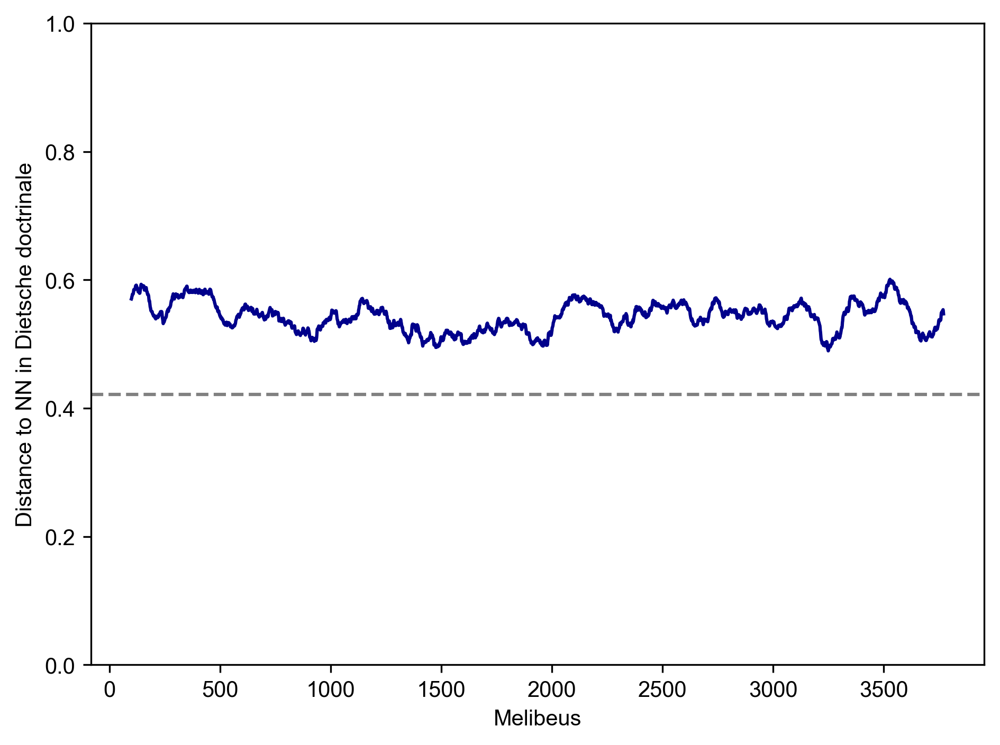

In [42]:
t1, t2 = 'Melibeus', 'Dietsche doctrinale'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=100)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

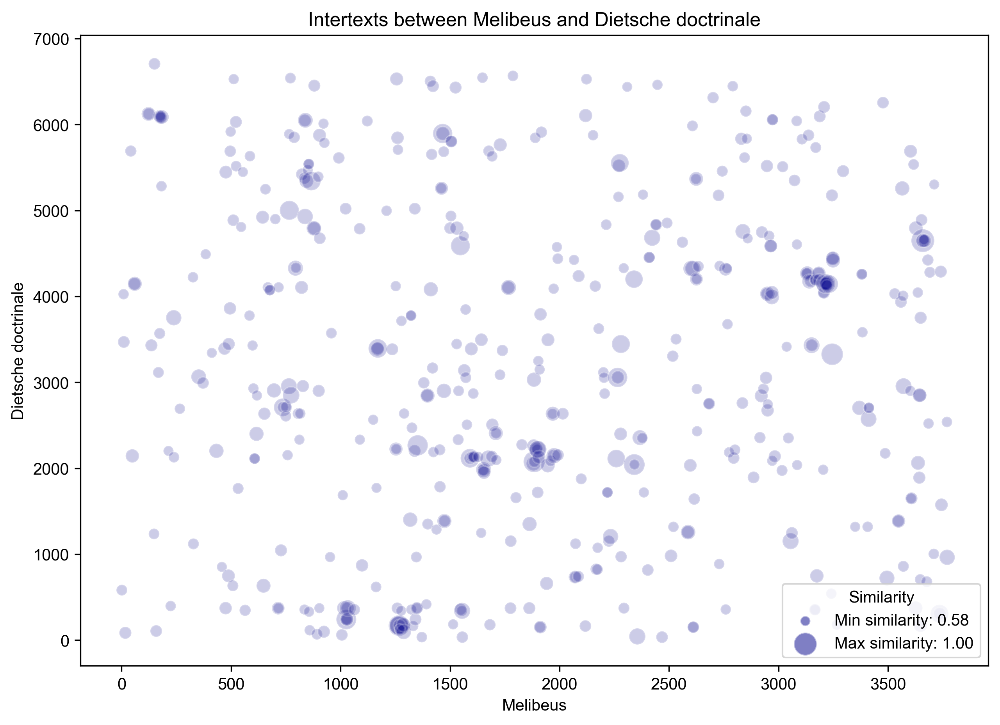

In [43]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [44]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### 8. Sidrac and Lekenspiegel <a name='S-LS'/>

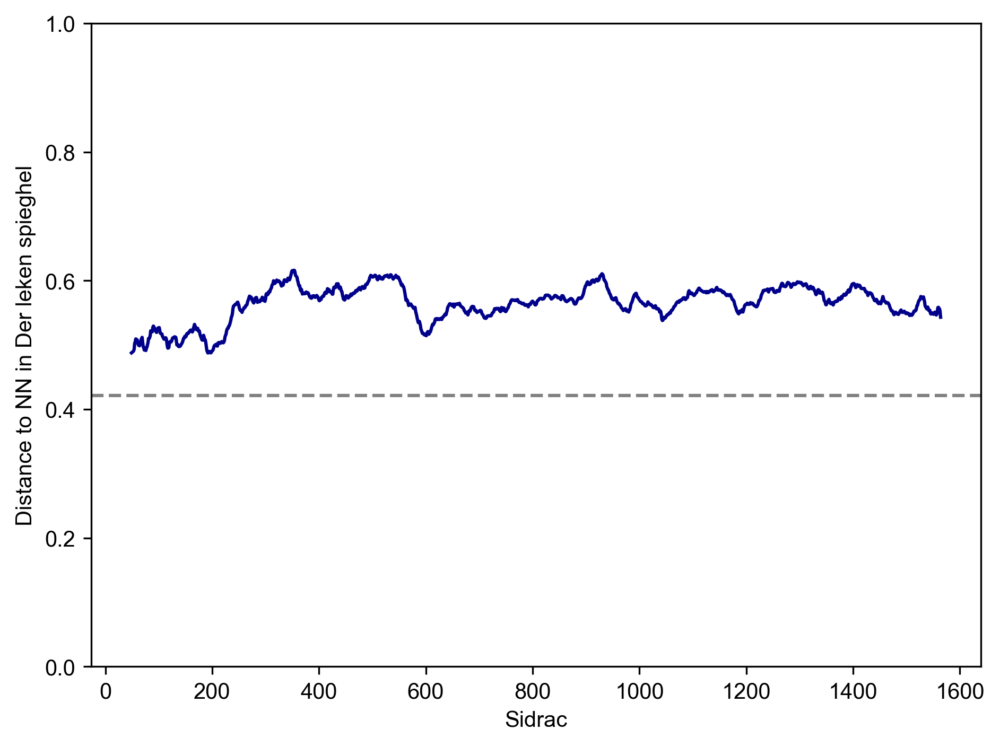

In [45]:
t1, t2 = 'Sidrac', 'Der leken spieghel'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=50)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

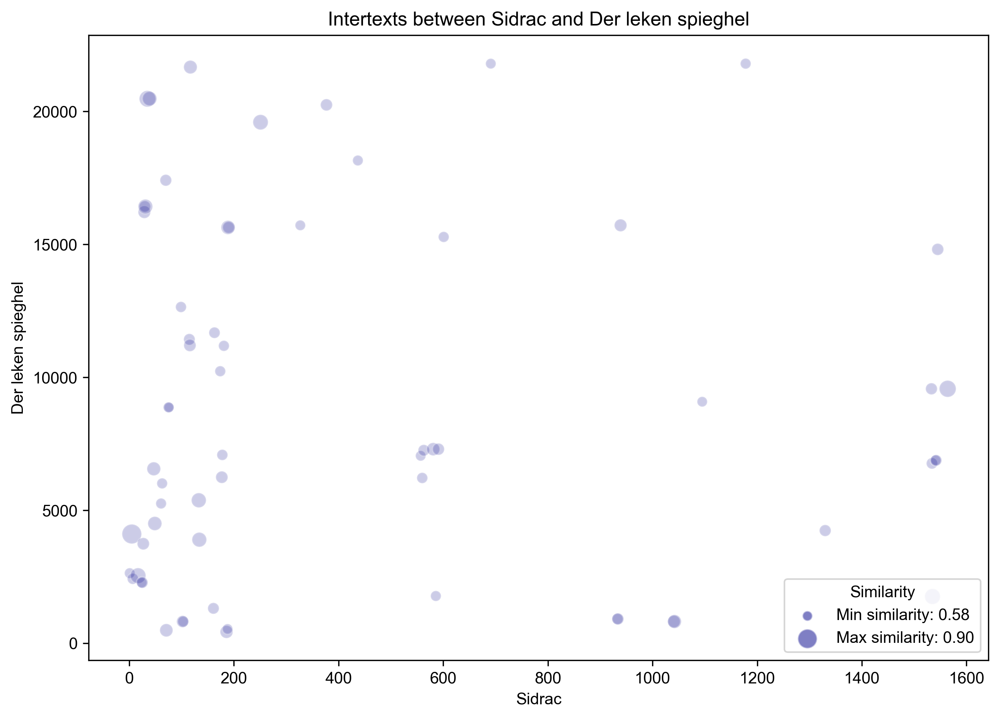

In [46]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [47]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### 9. Sidrac and Dietsche doctrinale <a name='S-DD'/>

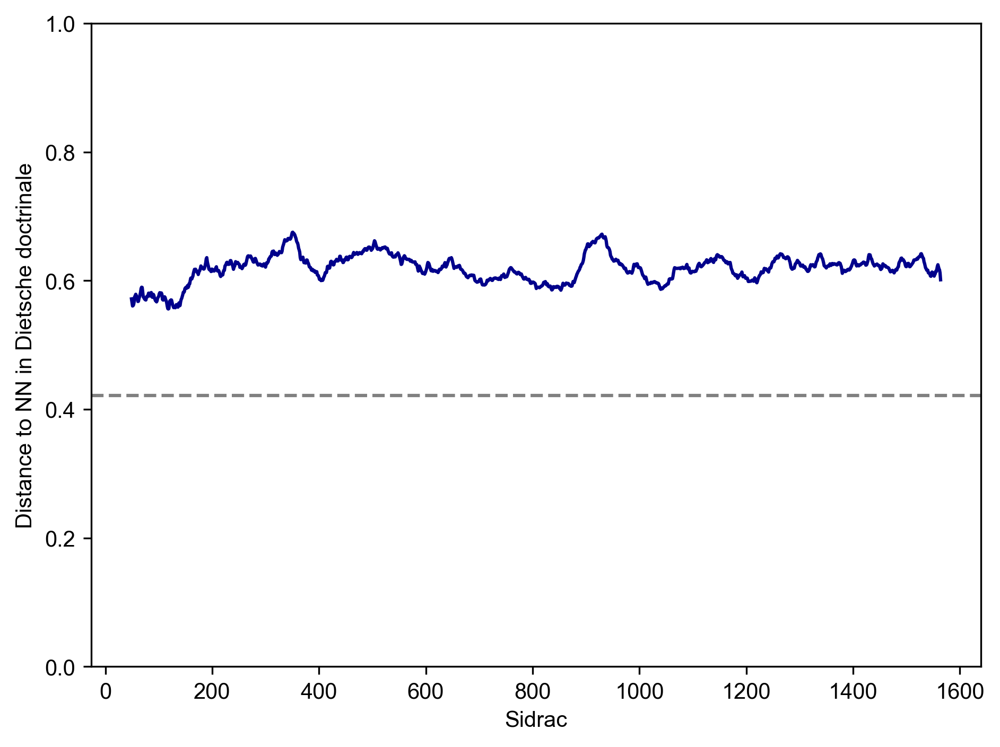

In [48]:
t1, t2 = 'Sidrac', 'Dietsche doctrinale'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=50)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()


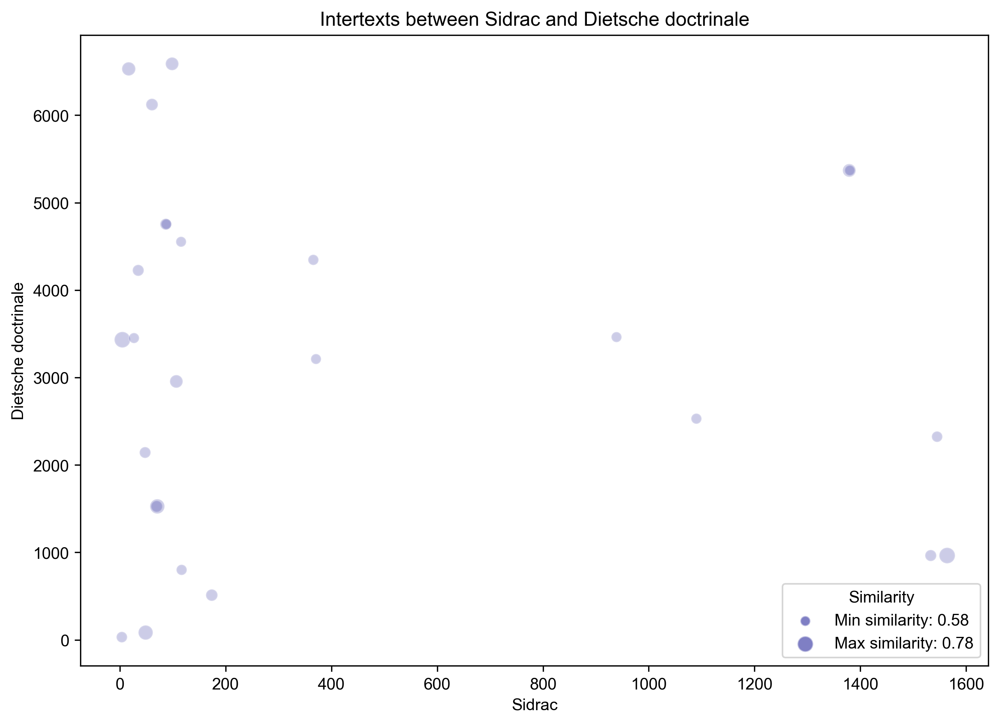

In [49]:
plot_intertexts(t1, t2, distances, threshold=optim_th)


In [50]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)

### 10. Sidrac and Jans teesteye <a name='S-JT'/>

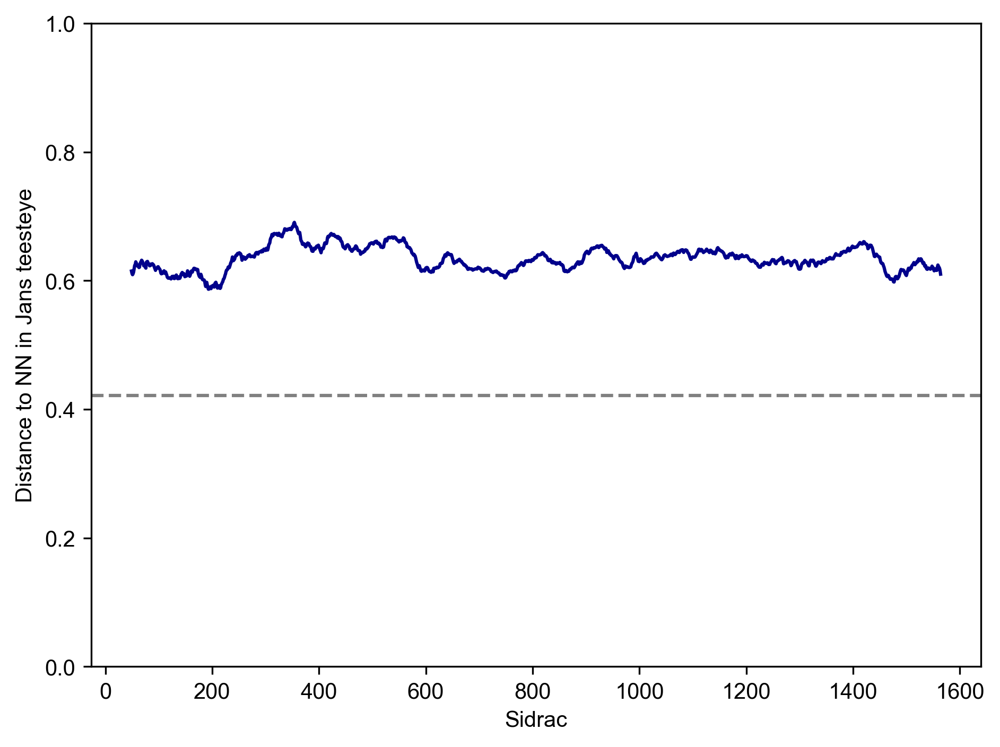

In [51]:
t1, t2 = 'Sidrac', 'Jans teesteye'
distances = pairwise(t1, t2, rhyme_weight=optim_rw)
min_dists = pd.Series(distances.min(axis=1))
ax = plot_min_distance_nn(t1, t2, min_dists, threshold=optim_th, rolling_size=50)
interpol_idxs, interpol_names = get_interpolations(t1)

plt.tight_layout()

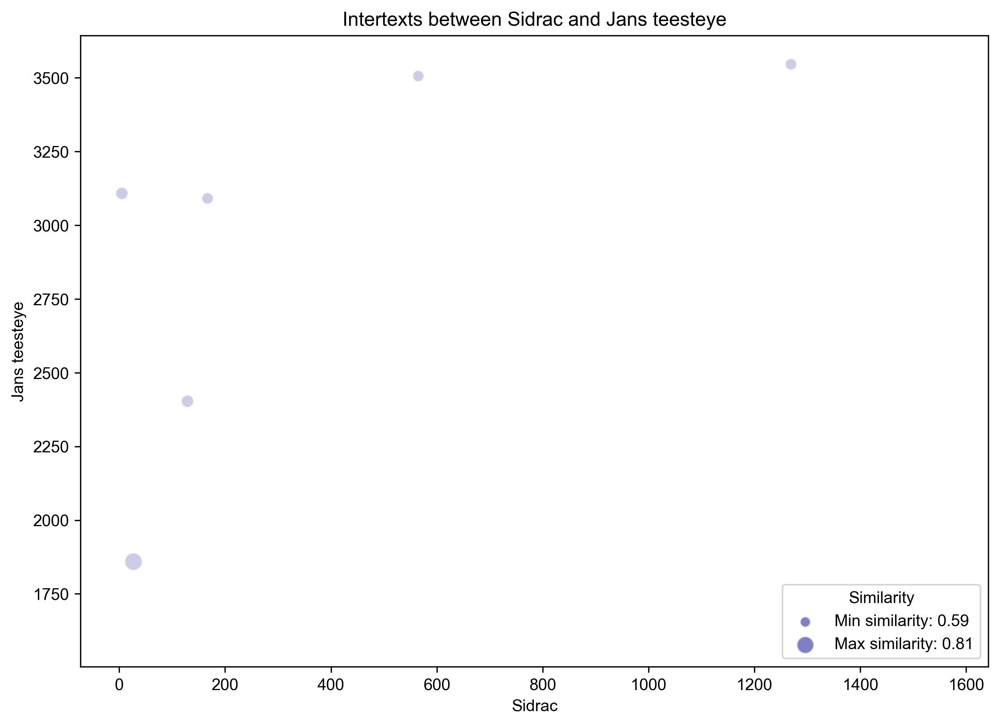

In [52]:
plot_intertexts(t1, t2, distances, threshold=optim_th)

In [53]:
plot_intertexts_interactable(t1, t2, distances, threshold=optim_th)